In [1]:
import os
import numpy as np
import pandas as pd

from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme()
import contextily as cx

import sys
sys.path.insert(1, os.path.join(sys.path[0], '/Users/johannesommer/Documents/Universitetet/Kandidat/4. semester/Thesis/Code/dataset_creation'))
from process_tree_inventory import load_data, remove_duplicates, remove_bushes, get_species_info, split_trees

### Load and preprocess tree data

In [2]:
# Load data
gdf = load_data(f'../data/raw/tree_inventory.csv')

In [3]:
# Remove duplicate rows
gdf_wo_dup = remove_duplicates(gdf)
print(f'Removed {len(gdf) - len(gdf_wo_dup)} rows that were duplicates')

Removed 256 rows that were duplicates


### Examine features

In [4]:
# Show how many rows contain data for columns related to the type of tree
cols_type = ['kategori', 'element', 'ny_dm_element', 'ny_dm_under_element', 'busk_trae']
gdf_wo_dup[cols_type].count().sort_values(ascending=False) / len(gdf_wo_dup)

ny_dm_element          1.000000
kategori               0.999968
busk_trae              0.999968
ny_dm_under_element    0.999952
element                0.971167
dtype: float64

In [5]:
# Show the distribution of trees and bushes
gdf_wo_dup.groupby('busk_trae').size().sort_values(ascending=False)[:25]

busk_trae
Træ     62639
Busk      482
dtype: int64

In [6]:
# Remove bushes
gdf_wo_dup = remove_bushes(gdf_wo_dup)

In [7]:
# Show tree categories
gdf_wo_dup.groupby('ny_dm_element').size().sort_values(ascending=False)

ny_dm_element
Park- og naturtræer     27860
Gade- og allétræer      25228
Træer i bevoksninger     6206
Formede træer            2197
Private træer            1148
dtype: int64

In [8]:
# Show tree subcategories
gdf_wo_dup.groupby('ny_dm_under_element').size().sort_values(ascending=False)

ny_dm_under_element
Parktræ               27284
Gadetræ               19071
Træ i bevoksning       6206
Allétræ                6157
Formklippet træ        1216
Privat træ             1145
Kronereduceret træ      590
Naturtræ                576
Knudebeskåret træ       374
Stynet træ               17
dtype: int64

In [9]:
# Remove park trees
gdf_wo_dup = gdf_wo_dup[(gdf_wo_dup['kategori'] != 'parktræ') & (gdf_wo_dup['ny_dm_element'] != 'Park- og naturtræer') & (~gdf_wo_dup['ny_dm_under_element'].isin(['Parktræ', 'Naturtræ']))]

# Remove private trees
gdf_wo_dup = gdf_wo_dup[(gdf_wo_dup['kategori'] != 'privat træ') & (gdf_wo_dup['ny_dm_element'] != 'Private træer')]

# Remove trees in stands
gdf_wo_dup = gdf_wo_dup[gdf_wo_dup['ny_dm_element'] != 'Træer i bevoksninger']

In [10]:
# Show how many rows contain data for columns related to the tree species
cols_label = ['traeart', 'dansk_navn', 'slaegt', 'slaegtsnavn']
gdf_wo_dup[cols_label].count().sort_values(ascending=False) / len(gdf_wo_dup)

traeart        0.998539
dansk_navn     0.998539
slaegt         0.998539
slaegtsnavn    0.998539
dtype: float64

In [11]:
# Show n. of unique values for species columns
gdf_wo_dup[cols_label].nunique()

traeart        220
dansk_navn     174
slaegt          50
slaegtsnavn     49
dtype: int64

In [12]:
# Remove trees with no species name
gdf_wo_dup = gdf_wo_dup[~gdf_wo_dup['slaegtsnavn'].isnull()]

In [13]:
# Get top 12 species
species_top = gdf_wo_dup.groupby('slaegtsnavn').size().sort_values(ascending=False)
gdf_wo_dup[gdf_wo_dup['slaegtsnavn'].isin(species_top.index[:12])].groupby(['slaegtsnavn', 'slaegt']).size().sort_values(ascending=False)

slaegtsnavn      slaegt       
Lind             Tilia sp.        5350
Platan           Platanus sp.     2240
Røn              Sorbus sp.       1875
Ask              Fraxinus sp.     1463
Løn              Acer sp.         1412
Eg               Quercus sp.      1359
Robinie          Robinia sp.      1338
Kirsebær/Blomme  Prunus sp.        982
Elm              Ulmus sp.         513
Tjørn            Crataegus sp.     444
Hestekastanie    Aesculus sp.      390
Æble             Malus sp.         354
dtype: int64

In [14]:
# Get fraction of trees that belong to one of the top 12 species
len(gdf_wo_dup[gdf_wo_dup['slaegtsnavn'].isin(species_top[:12].index)]) / len(gdf_wo_dup)

0.8940013117400737

In [15]:
# Get fraction of trees that belong the top 1 species
len(gdf_wo_dup[gdf_wo_dup['slaegtsnavn'] == species_top.index[0]]) / len(gdf_wo_dup)

0.26991574592603806

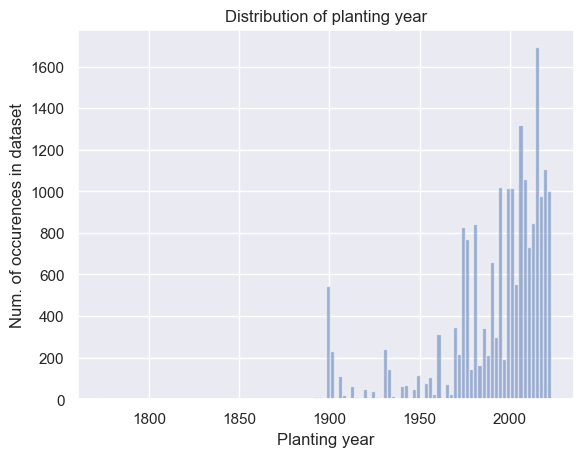

In [16]:
# Plot distribution of planting year
planting_year = gdf_wo_dup[gdf_wo_dup['planteaar'] > 0]['planteaar']
plt.hist(planting_year, bins=len(np.unique(planting_year)), alpha=0.5)
plt.title('Distribution of planting year')
plt.xlabel('Planting year')
plt.ylabel('Num. of occurences in dataset')
plt.show()

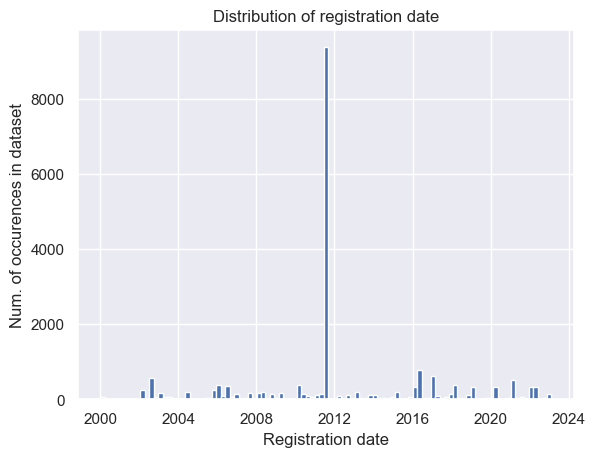

In [17]:
# Plot distribution of registration date
gdf_wo_dup['reg_dato'] = pd.to_datetime(gdf_wo_dup['reg_dato'])
plt.hist(gdf_wo_dup['reg_dato'], bins=round(gdf_wo_dup['reg_dato'].nunique()/12))
plt.title('Distribution of registration date')
plt.xlabel('Registration date')
plt.ylabel('Num. of occurences in dataset')
plt.show()

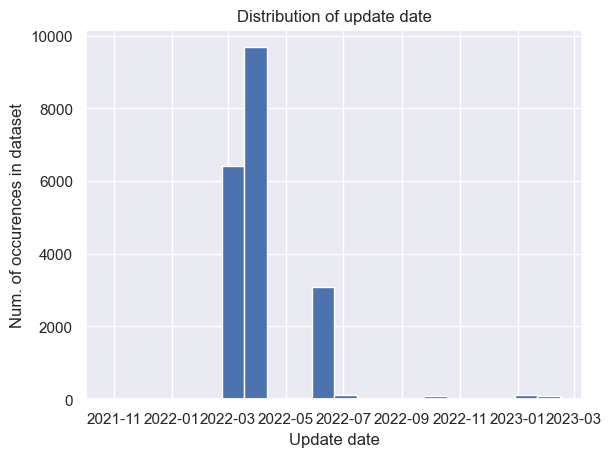

In [18]:
# Plot distribution of update date
gdf_wo_dup['opdateret_dato'] = pd.to_datetime(gdf_wo_dup['opdateret_dato'])
plt.hist(gdf_wo_dup['opdateret_dato'], bins=round(gdf_wo_dup['opdateret_dato'].nunique()/6))
plt.title('Distribution of update date')
plt.xlabel('Update date')
plt.ylabel('Num. of occurences in dataset')
plt.show()

### Add species information

In [19]:
# Dict for renaming species to align with names on vdberk.com
species_name_map = {"Acer campestre 'Queen Elisabeth'": "Acer campestre 'Queen Elizabeth'",
                    'Acer ginnala': 'Acer tataricum subsp. ginnala',
                    "Acer platanoides 'Farlakes Green'": "Acer platanoides 'Farlake's Green'",
                    "Acer saccharinum 'Pyramidialis'": "Acer saccharinum 'Pyramidale'",
                    "Aesculus hippoc. 'Baumannii'": "Aesculus hippocastanum 'Baumannii'",
                    "Amelanchier laevis 'Ballerina'": "Amelanchier 'Ballerina'",
                    'Cedrús atlántica': 'Cedrus libani subsp. atlantica',
                    'Crataegus lavallei': 'Crataegus lavalleei',
                    'Eleagnus angustifolia': 'Elaeagnus angustifolia',
                    "Fraxinus excelsior 'Pendula'": "Fraxinus excelsior 'Aurea Pendula'",
                    "Fraxinus pensylvanica 'Zundert'": "Fraxinus pennsylvanica 'Zundert'",
                    "Malus hybr. 'Rudolf'": "Malus 'Rudolph'",
                    "Malus hybr. 'Street Parade'": "Malus baccata 'Street Parade'",
                    "Malus x 'Elstar'": "Malus domestica 'Elstar'",
                    "Pinus sylvestris 'Typ Norwegen'": "Pinus sylvestris 'Norska'",
                    'Platanus hybr. acerifolia': 'Platanus hispanica',
                    "Populus simonii 'Fastgiata'": "Populus simonii 'Fastigiata'",
                    "Prunus ceracifera 'Nigra'": "Prunus cerasifera 'Nigra'",
                    "Prunus domestica 'Ouillins Reine Claude'": "Prunus domestica 'Reine Claude d'Oullins'",
                    "Prunus subhirtélla 'Accolade'": "Prunus 'Accolade'",
                    "Prunus subhirtella 'Hally Jolivette'": "Prunus 'Hally Jolivette'",
                    "Prunus x hilleri 'Spire'": "Prunus 'Spire'",
                    'Pyrus caucasica': 'Pyrus communis subsp. caucasica',
                    "Sorbus latifolia 'Atro'": "Sorbus latifolia 'Atrovirens'",
                    "Tilia cordata 'Green Spire'": "Tilia cordata 'Greenspire'",
                    'Tilia euchlora': 'Tilia europaea euchlora',
                    "Tilia tomentosa 'Brabrant'": "Tilia tomentosa 'Brabant'",
                    "Tilia x 'Zwarte Linde'": "Tilia europaea 'Zwarte Linde'",
                    "Sórbus commixta 'Dodong'": "Sorbus 'Dodong'",
                    'Styphnolobium japonica': 'Styphnolobium japonicum',
                    'Viburnum x bodnantense': "Viburnum bodnantense 'Dawn'"}

# Dict for adding manual height information
# These are from various sources found by Googling the species name
species_manual_height = {"Acer platanoides 'Allershausen'": 30,
                         'Alnus spaethii': 18,
                         "Amelachier canadensis": 6,
                         'Amelánchier laevis': 6,
                         "Betula pendula 'Dalecarlica'": 20,
                         'Betula pendula fk penla': 30,
                         "Crataegus crus-galli": 8,
                         'Crataegus intricata': 5,
                         "Crataegus laevigata 'Paul's Scarlet'": 6,
                         "Crataegus monogyna 'PKP select'": 8,
                         'Crataegus prunifolia': 6,
                         "Fraxinus excelsior 'Robusta'": 12,
                         "Juniperus communis 'Hibernica'": 3,
                         "Juniperus virginiana 'Sky Rocket'": 6,
                         'Larix hybr. eurolepis': 30,
                         "Malus domestica 'Guldborg'": 3,
                         "Malus domestica 'Ildrød Pigeon'": 6,
                         "Malus domestica 'Rød Gråsten'": 6,
                         "Malus hybr. 'Akso'": 4,
                         "Malus hybr. 'Braendkjaer'": 6,
                         "Malus hybr. 'Dir. Moerland'": 6,
                         'Malus sieboldii': 6,
                         'Pinus nigra': 15,
                         "Populus canadensis 'Bachalierii'": 70,
                         'Prunus cerasifera': 9,
                         "Prunus avium 'Merton Glory'": 6,
                         "Prunus domestica 'Incititia'": 5,
                         "Prunus padus 'Select'": 15,
                         "Prunus serrulata 'Shirofugen'": 6,
                         'Pyrus calleryana': 18,
                         "Robinia pseudoacacia 'Monophylla'": 65,
                         "Salix alba 'Saba'": 20,
                         "Salix alba 'Tristis'": 20,
                         "Salix caprea 'Mas'": 8,
                         "Salix matsudana 'Tortuosa'": 9,
                         'Sambuscus nigra': 8,
                         'Sorbus hybrida': 10,
                         "Sorbus intermedia 'Annisse Kirke'": 12,
                         'Sorbus mougeotii': 6,
                         "Tilia cordata 'Erecta'": 20,
                         "Tilia plathyphyllos 'Odin'": 20,
                         "Ulmus 'Rebona'": 25,
                         "Ulmus 'Regal'": 18}

In [20]:
# Add general species info to trees
gdf_wo_dup = get_species_info(gdf_wo_dup, species_name_map, species_manual_height)

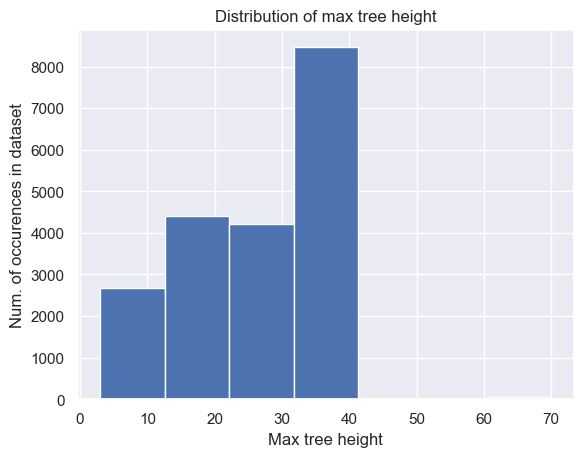

In [21]:
# Show distribution of max tree height
plt.hist(gdf_wo_dup['max_height'], bins=7) #int(gdf_wo_dup['max_height'].max() - gdf_wo_dup['max_height'].min()))
plt.title('Distribution of max tree height')
plt.xlabel('Max tree height')
plt.ylabel('Num. of occurences in dataset')
plt.show()

### Get distance between trees

In [22]:
import numpy as np
import pandas as pd
import os
os.environ['USE_PYGEOS'] = '0'
import geopandas as gpd
from shapely import wkt
from sklearn.neighbors import BallTree
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme()

In [23]:
# Load tree information
trees = pd.read_csv(f'../data/raw/tree_inventory_cleaned.csv')
trees['geometry'] = trees['geometry'].apply(wkt.loads)
trees = gpd.GeoDataFrame(trees, crs='epsg:4326', geometry='geometry')

In [24]:
def get_closest_point(ball_tree, loc):
    result = ball_tree.query([np.radians(list(loc))], k=2)
    earth_radius = 6371000
    return result[0][0][1] * earth_radius

In [25]:
# Create ball tree from coordinates of trees
ball_tree = BallTree(np.radians(trees[['lat', 'lng']].values),
                        metric = 'haversine')

# Get closest gt tree for each predicted tree
dists = [get_closest_point(ball_tree, loc) for loc in trees[['lat', 'lng']].values]
print(f'\nMin: {min(dists):.3f} \nMax: {max(dists):.3f} \nMean: {np.mean(dists):.3f}')


Min: 0.653 
Max: 464.004 
Mean: 9.726


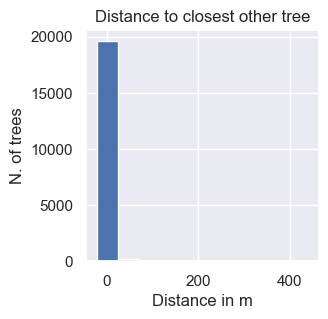

In [26]:
# Show dists
fig, ax = plt.subplots(figsize=(3, 3))
ax.hist(dists, align='left')
ax.set_title(f'Distance to closest other tree')
ax.set_xlabel('Distance in m')
ax.set_ylabel('N. of trees')
plt.show()

In [27]:
# Only show closest distances
max_dist = 15
dists_new = [dist for dist in dists if dist <= max_dist]
print(f'Fraction of distances below {max_dist}: {round((len([dist for dist in dists if dist <= max_dist]) / len(dists))*100)}%')
print('\nNew statistics:')
print(f'Min: {min(dists_new):.3f} \nMax: {max(dists_new):.3f} \nMean: {np.mean(dists_new):.3f}')

Fraction of distances below 15: 89%

New statistics:
Min: 0.653 
Max: 14.997 
Mean: 7.676


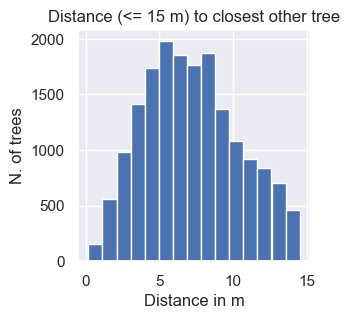

In [28]:
# Show dists <= max_dist
fig, ax = plt.subplots(figsize=(3, 3))
ax.hist(dists_new, bins=round(max(dists_new)), align='left')
ax.set_title(f'Distance (<= 15 m) to closest other tree')
ax.set_xlabel('Distance in m')
ax.set_ylabel('N. of trees')
plt.show()

In [29]:
# Get fraction of trees where the closest tree is within a radius of n
print('Fraction of trees with distance to closest tree below')
for n in [1, 1.5, 2, 2.5, 3, 3.5, 4, 15]:
    print(f'\t{n} m: {round((len([dist for dist in dists if dist > n]) / len(dists))*100)}%')

Fraction of trees with distance to closest tree below
	1 m: 100%
	1.5 m: 99%
	2 m: 98%
	2.5 m: 97%
	3 m: 94%
	3.5 m: 92%
	4 m: 88%
	15 m: 11%


### Show trees per split

In [34]:
# Split trees
gdf_wo_dup = split_trees(gdf_wo_dup)

In [35]:
# Get trees per split
splits = ['train', 'val', 'test']
for split in splits:
    n_trees_split = len(gdf_wo_dup[gdf_wo_dup['split'] == split])
    print(f'{split.capitalize()}: {n_trees_split} ({round((n_trees_split / len(gdf_wo_dup)) * 100)}%)')

Train: 11679 (59%)
Val: 3875 (20%)
Test: 3892 (20%)


In [37]:
# Get trees without split
print(f'Fraction of trees without split: {round((len(gdf_wo_dup[gdf_wo_dup["split"].isnull()]) / len(gdf_wo_dup)) * 100)}%')

Fraction of trees without split: 2%


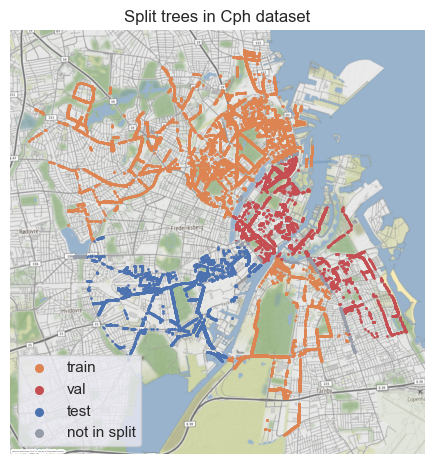

In [43]:
# Plot trees on map by split
new_crs = 'epsg:25832'
fig, ax = plt.subplots()
colors = [sns.color_palette()[i] for i in [1, 3, 0]]
for split, c in zip(splits, colors):
    gdf_wo_dup[gdf_wo_dup['split'] == split].to_crs(new_crs).plot(ax=ax, markersize=0.9, alpha=1, color=c, label=split)
gdf_wo_dup[gdf_wo_dup['split'].isnull()].to_crs(new_crs).plot(ax=ax, markersize=0.9, alpha=1, color='#969da8', label='not in split')
ax.set_axis_off()
ax.set_title('Split trees in Cph dataset')
leg = ax.legend()
for lh in leg.legendHandles: 
    lh.set_sizes([30])
cx.add_basemap(ax=ax, crs=new_crs, attribution_size=0)
plt.tight_layout()
plt.savefig(f'../visualizations/trees_split_cph.png', bbox_inches='tight', pad_inches=0)
plt.show()

### Show annotations

In [109]:
import os
import json
import pandas as pd
from PIL import Image
from random import randrange
import numpy as np

import matplotlib.pyplot as plt
from matplotlib.collections import PatchCollection
from matplotlib.patches import Polygon
import seaborn as sns
sns.set_theme()
import pydeck as pdk

import sys
sys.path.insert(1, os.path.join(sys.path[0], '/Users/johannesommer/Documents/Universitetet/Kandidat/4. semester/Thesis/Code'))
from utils import geo_coords_to_streetview_bbox, streetview_pixel_to_geo_coords, haversine_distance, get_nearest_panos, show_anns

In [110]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [111]:
# Define Mapbox API key
mapbox_api_key = 'pk.eyJ1Ijoiam9oYW5uZXJzIiwiYSI6ImNsa2w1cjhkNDAzNDgzcXBsNXZtMTZuaXQifQ.R4QX5SDq5guREx-xqKQ96g'
api_keys = {'mapbox': mapbox_api_key}

In [112]:
# Load cleaned data
data_path = '../data'
gdf_wo_dup = pd.read_csv('../data/raw/tree_inventory_cleaned.csv')

In [113]:
# Load panorama images
with open('../data/raw/panos_2.json', 'r') as f:
    panos = json.load(f)

In [ ]:
def root(a, r):
    return a**(1./float(r))

2.9864919663402536 15.0
QKSCLj0X7lXl1md35VQC3A [2019, 7] 55.69962525126853 12.5094228298441 2.9864919663402536
2869 55.69960985749847 12.509461885207765 1990 29 25.0 Acer platanoides 'Emerald Queen' Gade- og allétræer Gadetræ
Final tree size: [9.0, 15.0]
7.443686936619653
8.81848635755557


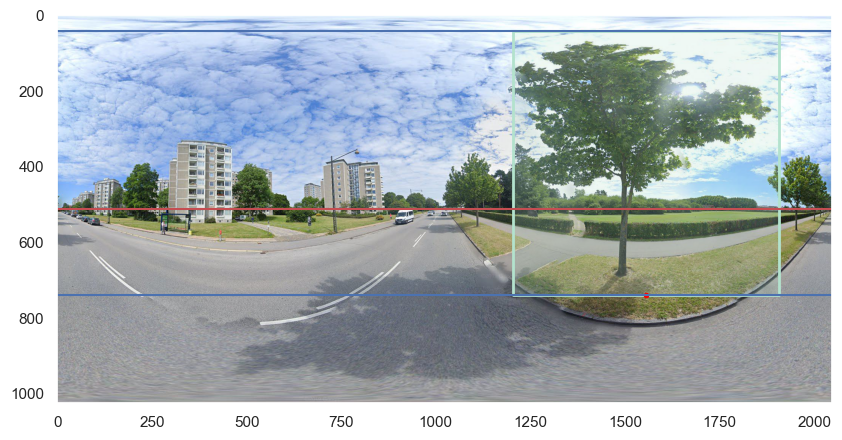

10.583639645246384 15.0
35IMmrdg6BivE7RqUa3dxg [2019, 7] 55.69970149332253 12.50950755262466 10.583639645246384
2869 55.69960985749847 12.509461885207765 1990 29 25.0 Acer platanoides 'Emerald Queen' Gade- og allétræer Gadetræ
Final tree size: [9.0, 15.0]
10.295514021825909
12.162254575628657


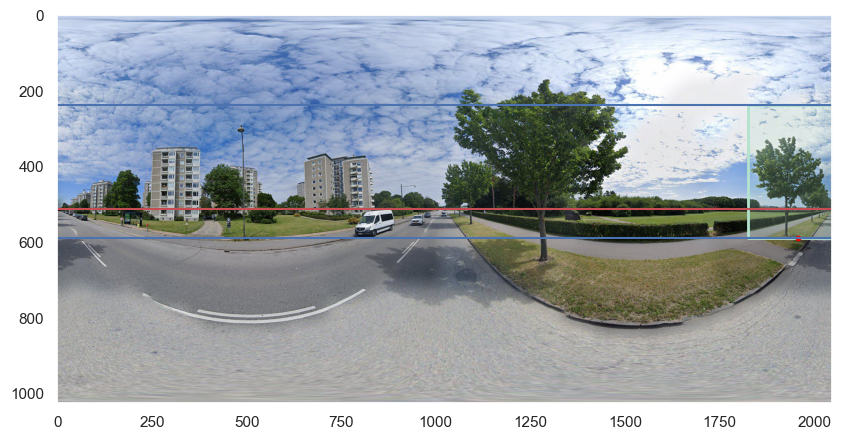

15.012734657831187 15.0
3M1LEXqOWjFo28lszidCRA [2019, 7] 55.69951160463496 12.50929756397767 15.012734657831187
2869 55.69960985749847 12.509461885207765 1990 29 25.0 Acer platanoides 'Emerald Queen' Gade- og allétræer Gadetræ
Final tree size: [9.0, 15.0]
10.523935091182238
12.348251148408364


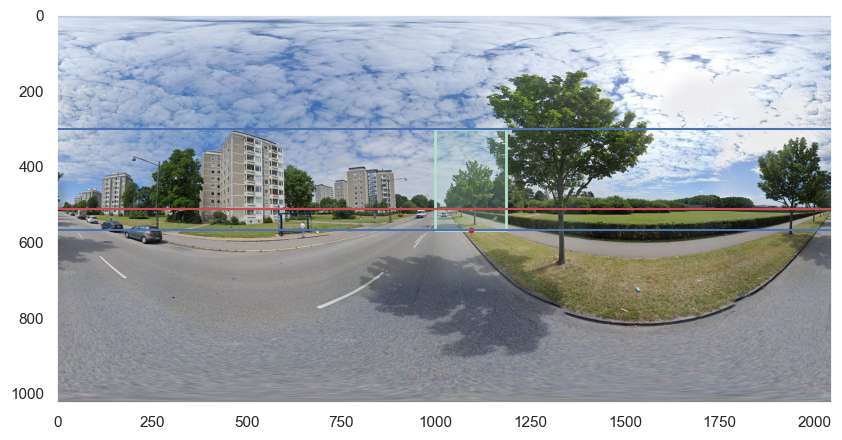

In [168]:
# For each tree, show nearest panorama image and bounding box around tree in image
data_temp = gdf_wo_dup[(gdf_wo_dup['max_height'] > 0)]
data_temp = data_temp.sample(len(data_temp))
data_temp = data_temp[~data_temp['traeart'].str.contains('sp.')] 
# data_temp = data_temp[data_temp['ny_dm_element'] == 'Formede træer']
# data_temp = data_temp[data_temp['id'] == 17863]

tree_widths_orig = []
tree_widths = []

c = 0
for idx, row in data_temp.iterrows():
    min_height = 9
    max_height =  max(min_height, row['max_height'])
    # Get nearest panorama
    lat, lng = row['lat'], row['lng']
    min_dist = 1.2
    max_dist = 18
    nearest_panos = get_nearest_panos(lat, lng, min_dist, max_dist, panos)
    # Remove panos that were captured before the tree was planted
    nearest_panos = [near_pano for near_pano in nearest_panos if near_pano[0]['Data']['image_date'][0] > row['planteaar']]
    # nearest_panos = [near_pano for near_pano in nearest_panos if near_pano[1] > 17]
    if len(nearest_panos) > 2:
        if nearest_panos[0][1] > 3:
            continue
        c += 1
        # # Choose random panorama
        # pano, dist = nearest_panos[randrange(len(nearest_panos))]
        for (pano, dist) in nearest_panos:
            pano_id = pano['Location']['panoId']
            # Get pixel coordinates of bounding box
            if pano_id in panos:
                # Reduce bounding box size if newly planted tree ..
                age = pano['Data']['image_date'][0] - row['planteaar']
                age_max_height = 15
                if max_height < 25:
                    age_max_height = 10
                if max_height > 30:
                    age_max_height = 25
                max_height_new = max_height * 0.6
                height = max_height_new if age >= age_max_height else min_height + (age / age_max_height) * (max_height_new - min_height)
                # .. or cutted tree
                if (row['ny_dm_element'] == 'Formede træer') & (max_height > 20):
                    height = 0.5 * height
                height = max(4, height)
                tree_sz_sw = [0.6 * height, height]

                # if tree_sz_sw[0] > 15:
                #     continue

                # Get bounding box
                x1, y1, x2, y2, x, y = geo_coords_to_streetview_bbox(pano, lat, lng, tree_sz_sw)
                filepath = f'../data/images/streetview_2/{pano_id}.jpg'
                img = Image.open(filepath)

                # image_width = np.array(img).shape[1]
                # if ((0 <= x <= 0.1 * image_width) or (0.4 * image_width <= x <= 0.6 * image_width) or (0.9 * image_width <= x <= 1 * image_width)):
                #     continue

                print(dist, height)
                # Print information about panorama image
                print(pano_id, pano['Data']['image_date'], pano['Location']['lat'], pano['Location']['lng'], dist)
                # Print information about tree
                print(row['id'], lat, lng, row['planteaar'], age, row['max_height'], row['traeart'], row['ny_dm_element'], row['ny_dm_under_element'])
                print('Final tree size:', tree_sz_sw)

                # Remove correction of coordinates to get original y1
                f_y = 1.02
                m = np.array(img).shape[0] / 2
                y1_orig = m - root(m - y1, f_y)
                f_x = 0.03
                x1_orig = ((m - y1) **(-f_x)) * (x * ((m - y1) **f_x - 1) + x1)
                x2_orig = ((m - y1) **(-f_x)) * (x * ((m - y1) **f_x - 1) + x2)

                # Get tree width
                loc_coords = streetview_pixel_to_geo_coords(pano, x, y)
                x_side_orig = x1_orig if (x - x1_orig) > (x2_orig - x) else x2_orig
                loc_coords_side_orig = streetview_pixel_to_geo_coords(pano, x_side_orig, y2)
                tree_width_orig = 2 * haversine_distance(*loc_coords_side_orig, *loc_coords)
                tree_widths_orig.append(tree_width_orig)
                print(tree_width_orig)
                x_side = x1 if (x - x1) > (x2 - x) else x2
                loc_coords_side = streetview_pixel_to_geo_coords(pano, x_side, y2)
                tree_width = 2 * haversine_distance(*loc_coords_side, *loc_coords)
                tree_widths.append(tree_width)
                print(tree_width)
                
                # Plot bounding box
                fig, ax = plt.subplots(figsize=(10, 10))
                ax.imshow(img)
                # img_cropped = np.array(img)[max(int(y1), 0):int(y2), max(int(x1), 0):int(x2)]
                # ax.imshow(img_cropped)
                show_anns([[x1, y1, x2-x1, y2-y1]], ax)
                # ax.axis('off')
                ax.grid(False)
                ax.plot(x, y, color='red', marker='o', markersize=3)
                ax.axhline(y=0.5*np.array(img).shape[0], color='r', linestyle='-')
                ax.axhline(y=y1, color='b', linestyle='-')
                ax.axhline(y=y2, color='b', linestyle='-')
                # ax.set_title(f'{ages[i]} years')
                plt.show()

    if c >= 1:
        break

In [171]:
df_anns_gt = pd.DataFrame({'lat': lat,
                           'lng': lng,
                           'tree_width': tree_widths_orig})

layer_anns_gt = pdk.Layer('ScatterplotLayer',
                          df_anns_gt,
                          pickable=True,
                          get_position=['lng', 'lat'],
                        #   get_fill_color=[62, 250, 112],
                          get_radius='tree_width',
                          radiusScale=0.3,#0.35
                           # radius_min_pixels=3.2,
                           filled=False,
                           stroked=True,
                           lineWidthScale=0.25,
                           get_line_color=[62, 250, 112])

In [172]:
view_state = pdk.ViewState(latitude=lat, longitude=lng, zoom=18, bearing=0)
r = pdk.Deck(layers=[layer_anns_gt], 
             initial_view_state=view_state, 
             map_provider='mapbox', 
             api_keys=api_keys, 
             map_style='satellite',#'mapbox://styles/mapbox/satellite-v8',
             tooltip=True)
r.show()

DeckGLWidget(carto_key=None, custom_libraries=[], google_maps_key=None, json_input='{\n  "initialViewState": {…

In [138]:
os.environ['USE_PYGEOS'] = '0'
import geopandas as gpd
from shapely import wkt

In [145]:
# Load original data
gdf = pd.read_csv(f'../data/raw/tree_inventory.csv')
gdf['geometry'] = gdf['wkb_geometry'].apply(wkt.loads)
gdf = gpd.GeoDataFrame(gdf, crs='epsg:4326', geometry='geometry')

# Load cleaned data
gdf_wo_dup = pd.read_csv('../data/raw/tree_inventory_cleaned.csv')
gdf_wo_dup['geometry'] = gdf_wo_dup['geometry'].apply(wkt.loads)
gdf_wo_dup = gpd.GeoDataFrame(gdf_wo_dup, crs='epsg:4326', geometry='geometry')

/var/folders/z6/ws5k9dsj239bq9y_7gsxwmqw0000gn/T/ipykernel_36017/952382797.py:2: DtypeWarning: Columns (51,56,57,58,59,60,75,79,81,83,86,89,93,99,113,127,145,146,147,157,166,167,168,184,185,186,187,188,189,190,191) have mixed types. Specify dtype option on import or set low_memory=False.
  gdf = pd.read_csv(f'{data_path}/raw/tree_inventory.csv')


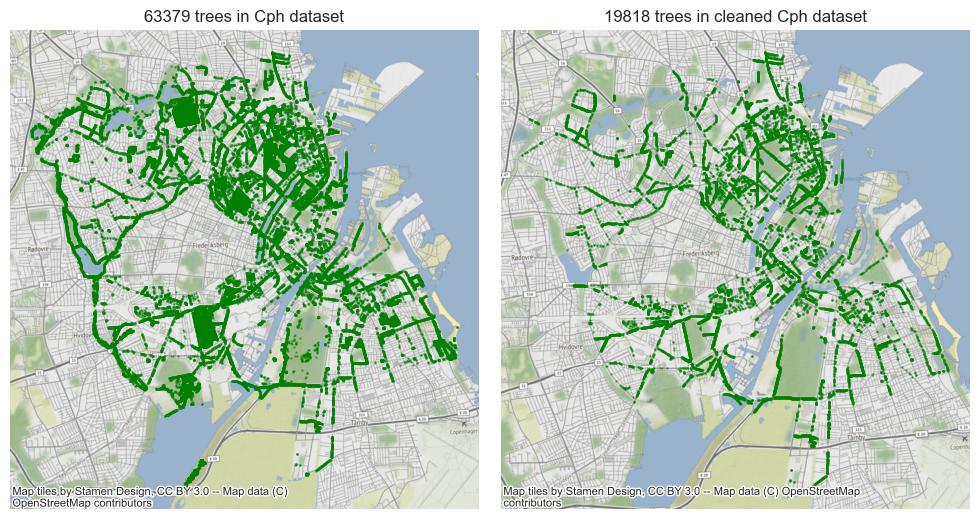

In [146]:
# Plot all trees on map
new_crs = 'epsg:25832'
fig, axs = plt.subplots(1, 2, figsize=(10, 10))
for data, ax, title in zip([gdf, gdf_wo_dup], axs, ['trees in Cph dataset', 'trees in cleaned Cph dataset']):
    data.to_crs(new_crs).plot(ax=ax, color='green', markersize=0.6, alpha=0.5)
    ax.set_axis_off()
    ax.set_title(f'{len(data)} {title}')
    cx.add_basemap(ax=ax, crs=new_crs)
    plt.tight_layout()
# plt.savefig(f'Visualizations/{filename}', bbox_inches='tight')
plt.show()

### Show trees close to each other

In [ ]:
import sys
sys.path.insert(1, os.path.join(sys.path[0], '/Users/johannesommer/Documents/Universitetet/Kandidat/4. semester/Thesis/Code/dataset_creation'))
from utils import geo_coords_to_streetview_pixel

1.4200831779352703
41235 41237
55.68966335209615 12.584837797807385
55.6896542086803 12.584821979761625
1970 1970 [2022, 7]


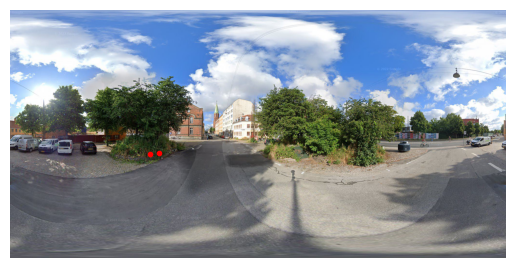

1.4200831779352703
41235 41237
55.68966335209615 12.584837797807385
55.6896542086803 12.584821979761625
1970 1970 [2022, 7]


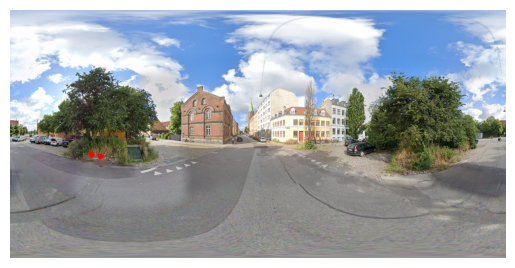

1.370209723218431
79251 79250
55.67294719893276 12.593364454575898
55.67295056419851 12.593343433419946
2016 2016 [2022, 7]


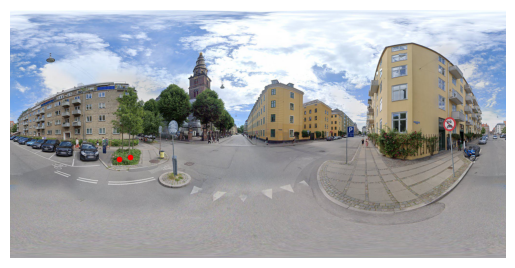

1.370209723218431
79251 79250
55.67294719893276 12.593364454575898
55.67295056419851 12.593343433419946
2016 2016 [2020, 9]


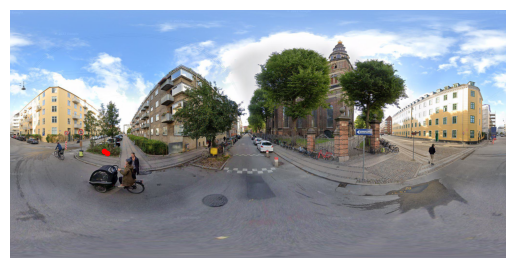

1.2457565488013853
82111 82128
55.66842979144001 12.545675144141777
55.6684398601409 12.54568385523201
2016 2016 [2020, 9]


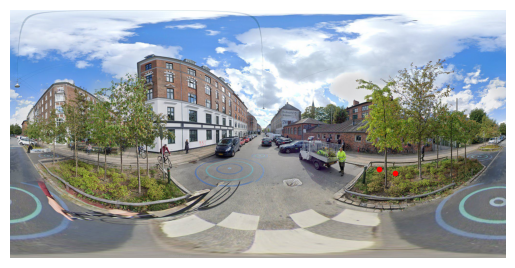

1.2457565488013853
82111 82128
55.66842979144001 12.545675144141777
55.6684398601409 12.54568385523201
2016 2016 [2020, 9]


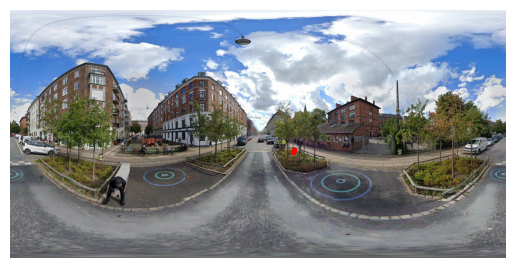

1.2731825571201514
94790 94772
55.720088012833656 12.498711778106625
55.72007875110701 12.4986998253294
2010 2010 [2019, 7]


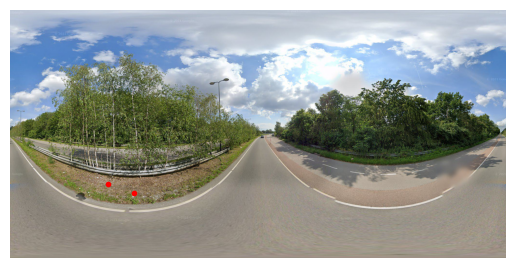

1.2731825571201514
94790 94772
55.720088012833656 12.498711778106625
55.72007875110701 12.4986998253294
2010 2010 [2019, 6]


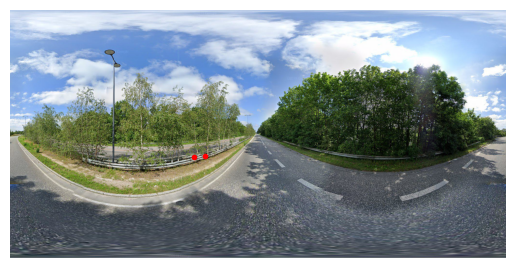

1.2731825571201514
94790 94772
55.720088012833656 12.498711778106625
55.72007875110701 12.4986998253294
2010 2010 [2019, 7]


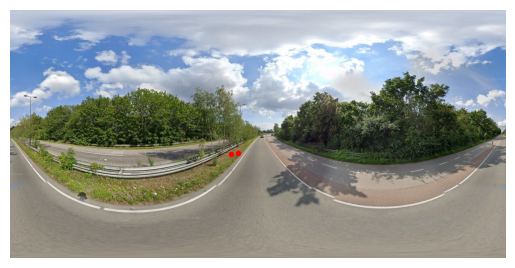

1.2731825571201514
94790 94772
55.720088012833656 12.498711778106625
55.72007875110701 12.4986998253294
2010 2010 [2019, 6]


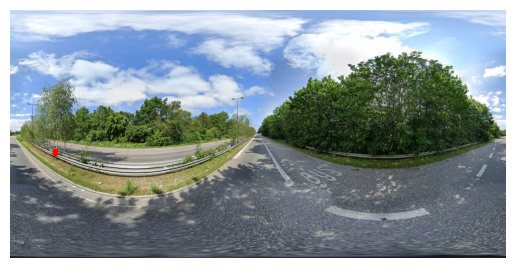

1.2731825571201514
94790 94772
55.720088012833656 12.498711778106625
55.72007875110701 12.4986998253294
2010 2010 [2019, 7]


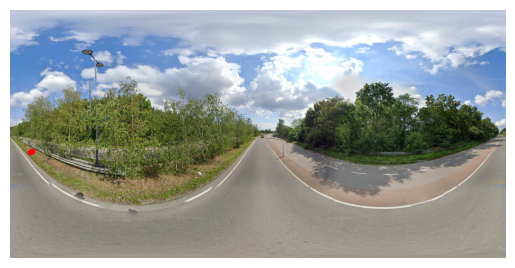

1.4237979899988094
88502 88501
55.68961615515365 12.584844693941076
55.68961990585012 12.584822974221224
1970 1970 [2022, 7]


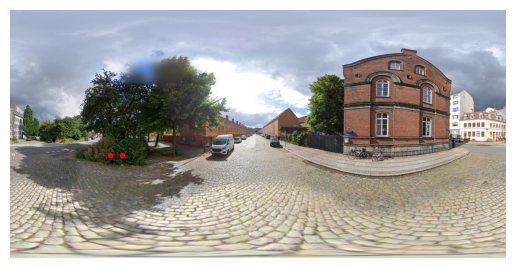

1.4237979899988094
88502 88501
55.68961615515365 12.584844693941076
55.68961990585012 12.584822974221224
1970 1970 [2022, 7]


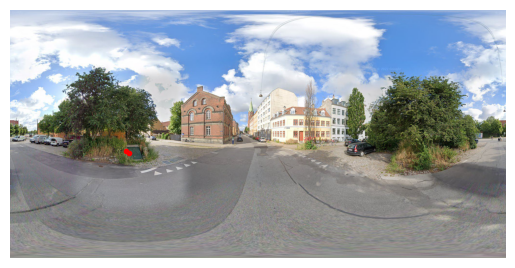

1.3186895973011221
41230 41227
55.68978991573755 12.58461683414314
55.68978872201101 12.58459590175296
1970 1970 [2022, 7]


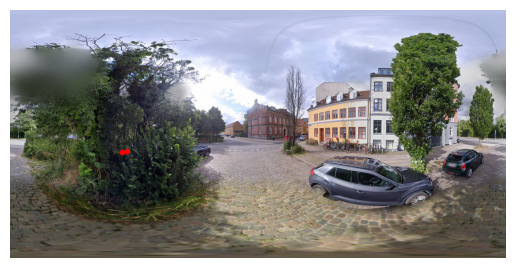

1.148511693339405
41230 41228
55.68978991573755 12.58461683414314
55.68977976165918 12.584613477859524
1970 1970 [2022, 7]


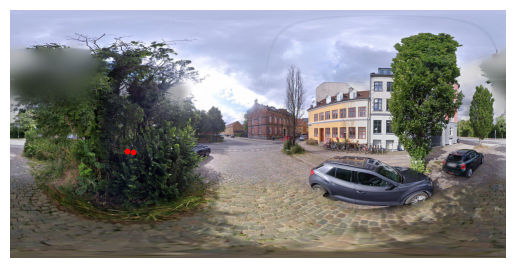

1.2988678914060863
94774 95805
55.71996399084061 12.498667396622212
55.7199566757464 12.49868356539996
2010 2010 [2019, 7]


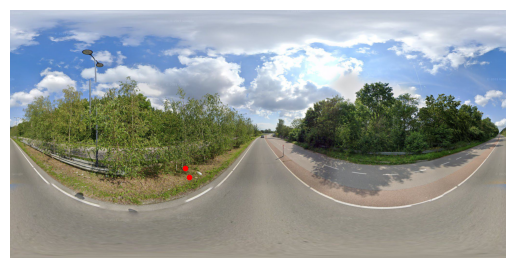

1.2988678914060863
94774 95805
55.71996399084061 12.498667396622212
55.7199566757464 12.49868356539996
2010 2010 [2019, 6]


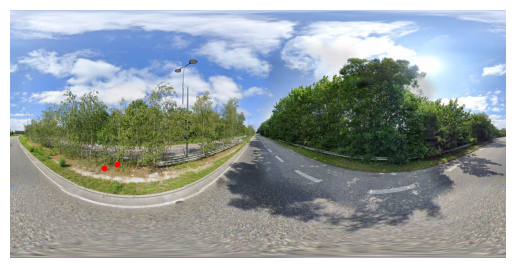

1.2988678914060863
94774 95805
55.71996399084061 12.498667396622212
55.7199566757464 12.49868356539996
2010 2010 [2019, 7]


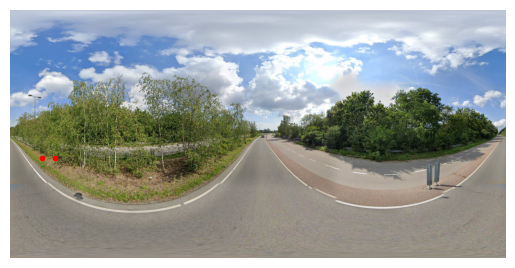

1.2988678914060863
94774 95805
55.71996399084061 12.498667396622212
55.7199566757464 12.49868356539996
2010 2010 [2019, 6]


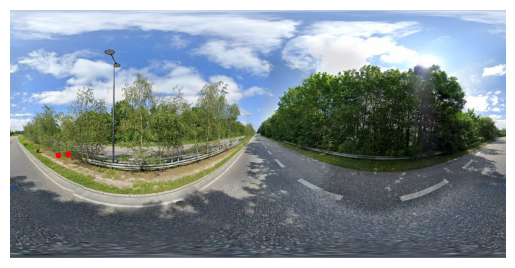

1.2315106649982985
95801 94777
55.719889489936286 12.498641981869389
55.71987848296221 12.498639801976903
2010 2010 [2019, 7]


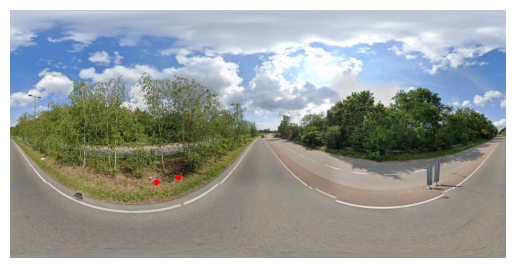

1.2315106649982985
95801 94777
55.719889489936286 12.498641981869389
55.71987848296221 12.498639801976903
2010 2010 [2019, 7]


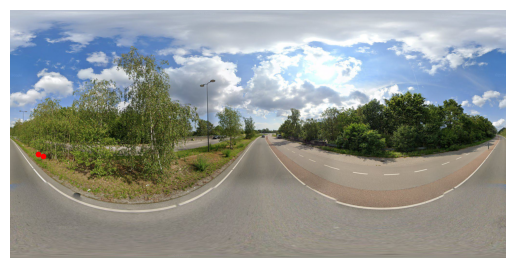

1.2315106649982985
95801 94777
55.719889489936286 12.498641981869389
55.71987848296221 12.498639801976903
2010 2010 [2019, 7]


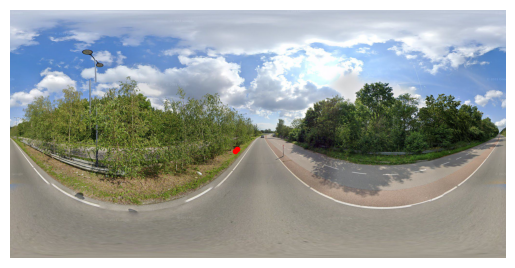

1.2315106649982985
95801 94777
55.719889489936286 12.498641981869389
55.71987848296221 12.498639801976903
2010 2010 [2019, 6]


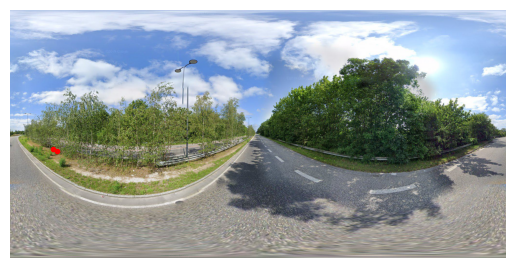

1.2002001747823765
90586 14214
55.666547968254186 12.615996216773013
55.66654047262228 12.615982446578704
2001 2001 [2020, 8]


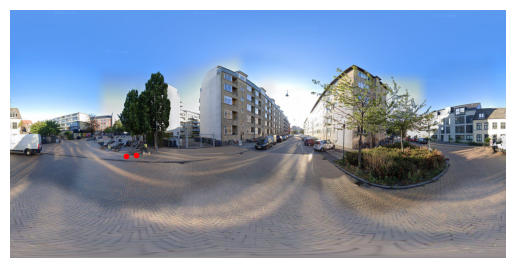

1.0561566318105655
58798 58799
55.68282926295547 12.554750687161786
55.68283321388019 12.554766008074465
2014 2014 [2017, 6]


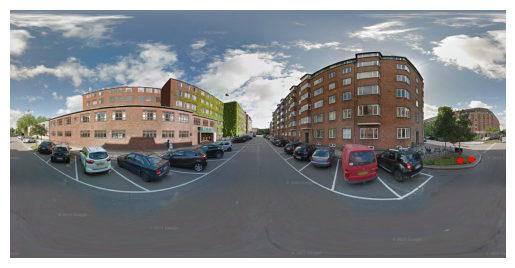

0.733618727443559
80758 80759
55.667257522757616 12.513931773668144
55.66726404763261 12.513930041670283
1930 1930 [2009, 6]


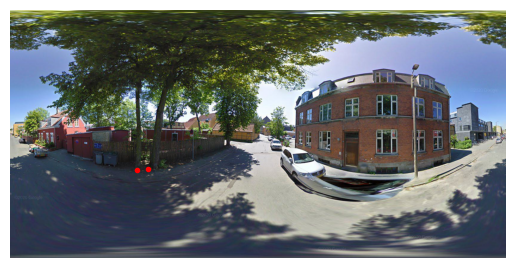

KeyboardInterrupt: 

In [171]:
min_dist = 1.3
max_dist = 12
for i, tree1 in gdf_wo_dup.iterrows():
    # Get distance to all other trees
    for _, tree2 in gdf_wo_dup.iloc[i+1:].iterrows():
        dist_trees = haversine_distance(tree1['lat'], tree1['lng'], tree2['lat'], tree2['lng'])
        if dist_trees <= 1.5:
            # Get nearest panorama
            nearest_panos = get_nearest_panos(panos, tree1['lat'], tree1['lng'], min_dist, max_dist)
            nearest_panos = [near_pano for near_pano in nearest_panos if (near_pano[0]['Data']['image_date'][0] > tree1['planteaar']) & (near_pano[0]['Data']['image_date'][0] > tree2['planteaar'])]
            for pano, dist_pano_tree in nearest_panos:
                pano_id = pano['Location']['panoId']

                print(dist_trees)
                print(tree1['id'], tree2['id'])
                print(tree1['lat'], tree1['lng'])
                print(tree2['lat'], tree2['lng'])
                print(tree1['planteaar'], tree2['planteaar'], pano['Data']['image_date'])

                # Get and plot bounding box
                x_1, y_1 = geo_coords_to_streetview_pixel(pano, tree1['lat'], tree1['lng'])
                x_2, y_2 = geo_coords_to_streetview_pixel(pano, tree2['lat'], tree2['lng'])
                filepath = f'../data/images/streetview_2/{pano_id}.jpg'
                img = Image.open(filepath)
                plt.axis('off')
                plt.imshow(img)
                # showAnns([[x1, y1, x2-x1, y2-y1]])
                plt.plot(x_1, y_1, color='red', marker='o', markersize=3)
                plt.plot(x_2, y_2, color='red', marker='o', markersize=3)
                plt.show()

In [ ]:
from random import shuffle

In [364]:
with open('../data/raw/panos_2.json', 'r') as fp:
    panos_old = json.load(fp)
with open('../data/raw/panos_2.json', 'r') as fp:
    panos_new = json.load(fp)

In [365]:
len(panos_old), len(panos_new)

(12959, 12881)

In [366]:
pano_ids_removed = [pano_id for pano_id in panos_old.keys() if pano_id not in panos_new.keys()]
pano_ids_added = [pano_id for pano_id in panos_new.keys() if pano_id not in panos_old.keys()]

In [367]:
len(pano_ids_removed), len(pano_ids_added)

(1088, 1010)

In [368]:
shuffle(pano_ids_removed), shuffle(pano_ids_added)

(None, None)

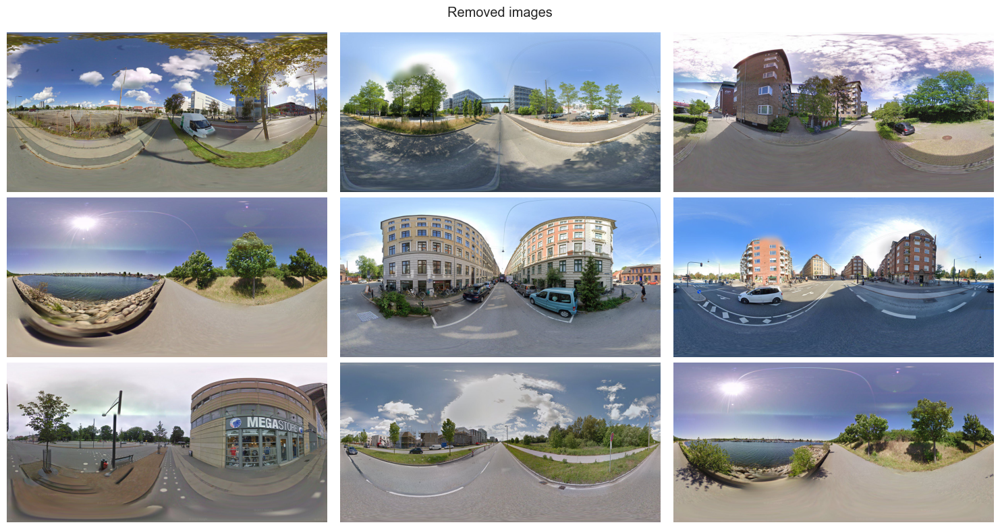

In [369]:
# Show removed images
fig, axs = plt.subplots(3, 3, figsize=(15, 8))
axs = axs.ravel()
for i, ax in enumerate(axs):
    pano_id = pano_ids_removed[i]
    filepath = f'../data/images/streetview_2/{pano_id}.jpg'
    img = Image.open(filepath)
    ax.set_axis_off()
    ax.imshow(img)
plt.suptitle('Removed images')
plt.tight_layout()
plt.show()

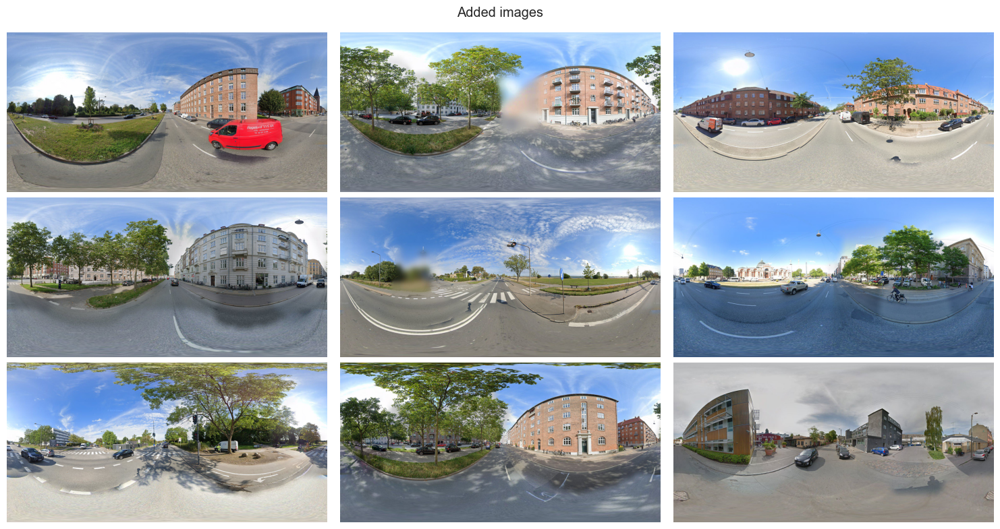

In [370]:
# Show added images
fig, axs = plt.subplots(3, 3, figsize=(15, 8))
axs = axs.ravel()
for i, ax in enumerate(axs):
    pano_id = pano_ids_added[i]
    filepath = f'../data/images/streetview_2/{pano_id}.jpg'
    img = Image.open(filepath)
    ax.set_axis_off()
    ax.imshow(img)
plt.suptitle('Added images')
plt.tight_layout()
plt.show()

In [14]:
import json
import os
from shutil import copyfile

In [61]:
# Get panos whose information has already been added to file
zoom = 2
with open(f'../data/raw/panos_{zoom}.json', 'r') as fp:
    panos = json.load(fp)
pano_ids_added = panos.keys()

# Get panos that have already been downloaded
streetview_path = f'../data/images/streetview_{zoom}'
pano_ids_loaded = set(file_name.split('.')[0] for file_name in os.listdir(streetview_path))

In [64]:
len(pano_ids_added), len(pano_ids_loaded), len(pano_ids_added) / len(pano_ids_loaded)

(14618, 23946, 0.6104568612711935)

In [63]:
[pano_id for pano_id in pano_ids_added if pano_id not in pano_ids_loaded]

[]

In [59]:
# Get panos in old directory
# streetview_path_old = f'../data/images/streetview_{zoom}-kopi'
# pano_ids_loaded_old = set(file_name.split('.')[0] for file_name in os.listdir(streetview_path_old))
pano_ids_loaded_old_df = pd.read_csv('filenames.csv', delimiter=';')
pano_ids_loaded_old = [filename.split('.')[0] for filename in pano_ids_loaded_old_df['filename']]

In [60]:
len(pano_ids_loaded) - len(pano_ids_loaded_old)

9045

In [15]:
for pano_id in pano_ids_loaded: 
    if pano_id not in pano_ids_loaded_old:
        filename = f'{pano_id}.jpg'
        copyfile(f'../data/images/streetview_{zoom}/{filename}',  f'../data/images/streetview_2_3/{filename}')